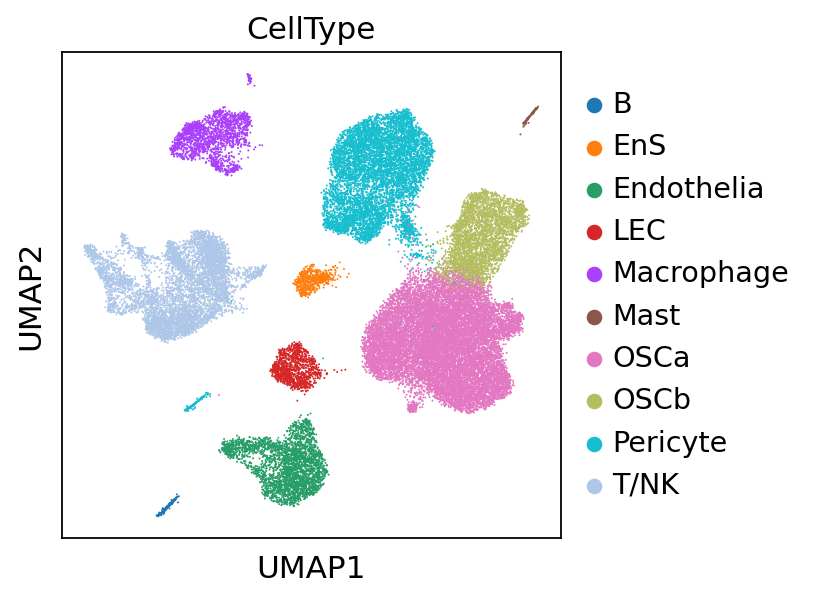

/home/liusong/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/liusong/.local/lib/python3.7/site-packages/ipykernel_launcher.py:20: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


,CellType,sampleID,TestID,Batch
AAACCTGAGTGCAAGC-14,OSCa,14,14,ourOEM
AAACCTGTCAATCACG-14,Endothelia,14,14,ourOEM
AAACCTGTCATTGCGA-14,OSCa,14,14,ourOEM
AAACCTGTCGAACTGT-14,LEC,14,14,ourOEM
AAACGGGCACTTAACG-14,Pericyte,14,14,ourOEM
...,...,...,...,...
TTTGTTGCACCGCTGA-21,LEC,21,21,ourOEM
TTTGTTGCAGAATGTA-21,T/NK,21,21,ourOEM
TTTGTTGCAGCGCTTG-21,OSCa,21,21,ourOEM
TTTGTTGGTTACACAC-21,T/NK,21,21,ourOEM


In [57]:
import numpy as np
import pandas as pd
import scanpy as sc
from collections import Counter
import matplotlib
#matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import scanpy.external as sce
import bbknn
sc.set_figure_params(dpi_save=300)

#load ourOEM data and cell annotations
OEMdata=sc.read_h5ad("/home/liusong/scRNA/endometriosis/V2data/scanpy/21samples/OEMdata_umap_leiden_BBKNN2024.h5ad")
OEMdata.obs['CellType']=OEMdata.obs['celltype2'].cat.rename_categories({"OSC":"OSCa"})
sc.pl.umap(OEMdata,color=['CellType'])
alldata=sc.read_10x_h5("/home/liusong/scRNA/endometriosis/V2data/aggregating/21samples/outs/count/filtered_feature_bc_matrix.h5",genome=None,gex_only=True)
alldata.var_names_make_unique()
alldata
ourOEM=alldata[OEMdata.obs_names,:]
ourOEM.obs['CellType']=OEMdata.obs['CellType']
ourOEM.obs['sampleID']=OEMdata.obs['sampleID']
ourOEM.obs['TestID']=ourOEM.obs['sampleID']
ourOEM.obs['Batch']="ourOEM"
ourOEM.obs

/home/liusong/.local/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


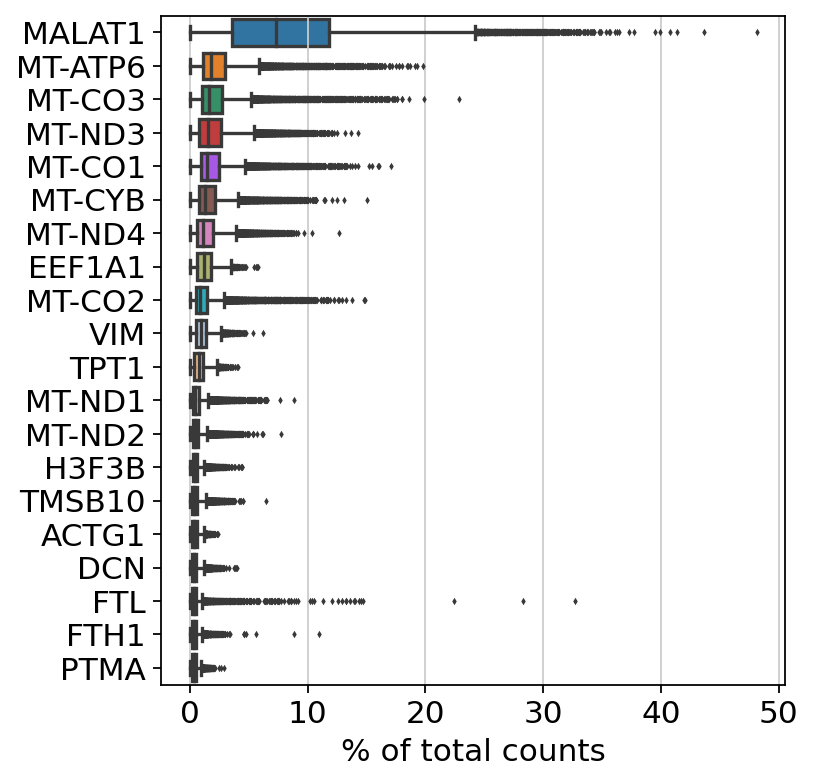

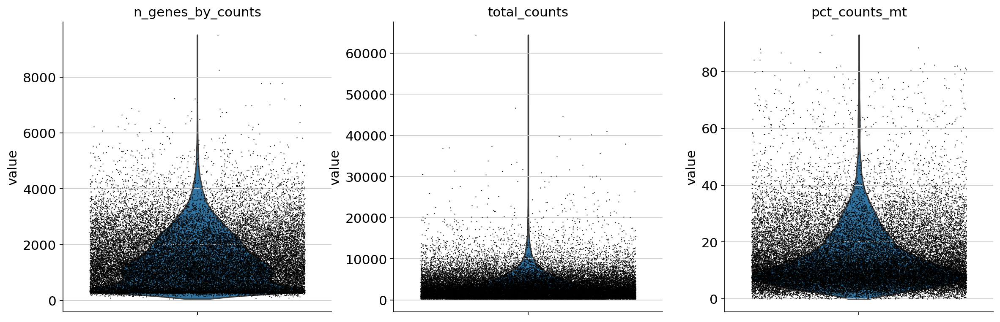

/home/liusong/.local/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number


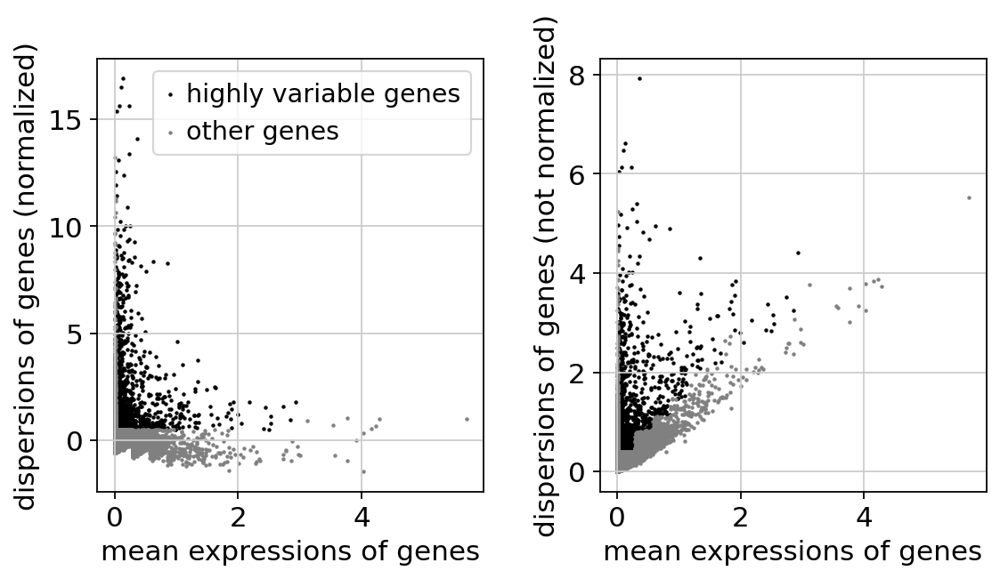

/home/liusong/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


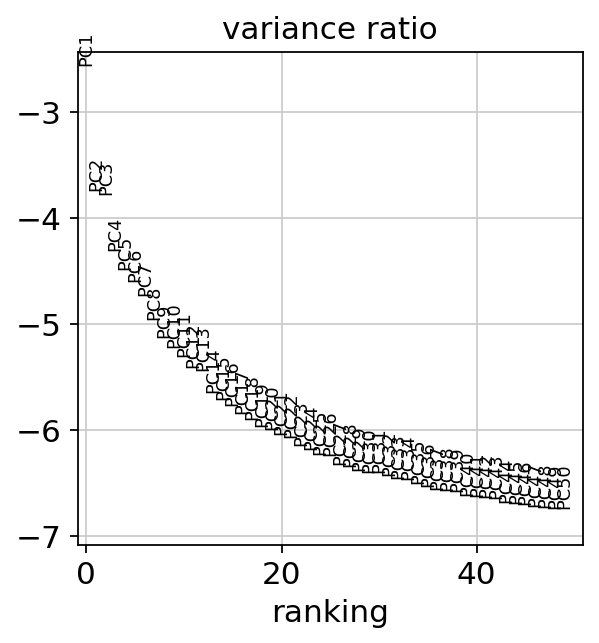

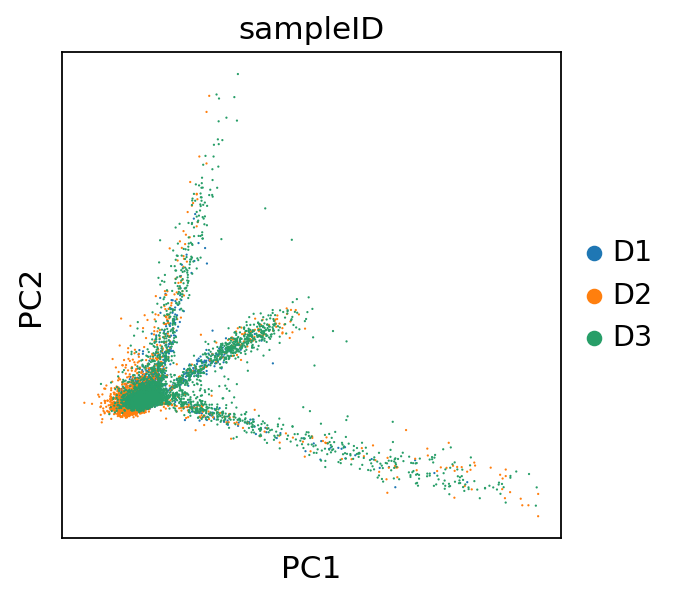

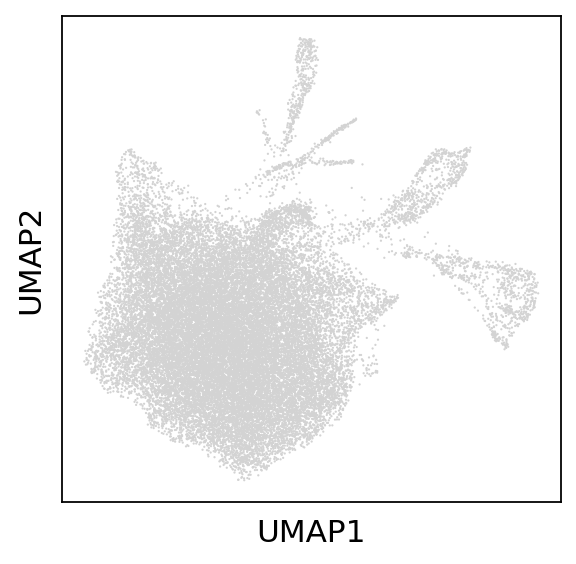

In [29]:
#reanalyze the GSE260685 data
import os
import anndata as ad

data1=sc.read_10x_mtx("/home/liusong/scRNA/endometriosis/V3data/Downloaded_Ovary_Control/ScienceAdvances_GSE260685/matrix/Donor1",var_names='gene_symbols')
data1.var_names_make_unique()
data1.obs.index=["D1" + x for x in data1.obs.index]
data1
data2=sc.read_10x_mtx("/home/liusong/scRNA/endometriosis/V3data/Downloaded_Ovary_Control/ScienceAdvances_GSE260685/matrix/Donor2",var_names='gene_symbols')
data2.var_names_make_unique()
data2.obs.index=["D2" + x for x in data2.obs.index]
data2
data3=sc.read_10x_mtx("/home/liusong/scRNA/endometriosis/V3data/Downloaded_Ovary_Control/ScienceAdvances_GSE260685/matrix/Donor3",var_names='gene_symbols')
data3.var_names_make_unique()
data3.obs.index=["D3" + x for x in data3.obs.index]
data3
OVCon=[data1,data2,data3]
OVCon=ad.concat(OVCon,merge="same")
OV_SA=OVCon

ribosomes=OVCon.var_names.str.match("^RP[LS]")
OVCon=OVCon[:,~ribosomes]
sc.pl.highest_expr_genes(OVCon,n_top=20)
OVCon.var['mt']=OVCon.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(OVCon, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(OVCon, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],jitter=0.4, multi_panel=True)

sc.pp.filter_genes(OVCon,min_cells=10)
OVCon = OVCon[OVCon.obs.n_genes_by_counts < 6000, :]
OVCon = OVCon[OVCon.obs.total_counts < 25000, :]
OVCon = OVCon[OVCon.obs.pct_counts_mt < 40, :]
sc.pp.filter_cells(OVCon,min_genes=500)
sc.pp.normalize_total(alldata, target_sum=1e4)
sc.pp.log1p(OVCon)

OVCon.obs['sampleID']=OVCon.obs_names.str[0:2]
sc.pp.highly_variable_genes(OVCon, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(OVCon)
OVCon= OVCon[:, OVCon.var.highly_variable]
sc.pp.regress_out(OVCon, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(OVCon, max_value=10)

sc.tl.pca(OVCon, svd_solver='arpack')
sc.pl.pca_variance_ratio(OVCon, log=True,n_pcs=50,save="adata_PCA_variance.png")
sc.pl.pca(OVCon,color=['sampleID'])

bbknn.bbknn(OVCon,batch_key='sampleID')
sc.tl.umap(OVCon)
sc.pl.umap(OVCon)
sc.tl.leiden(OVCon)
OVCon.write("OVCon_SA_BBKNN.h5ad")



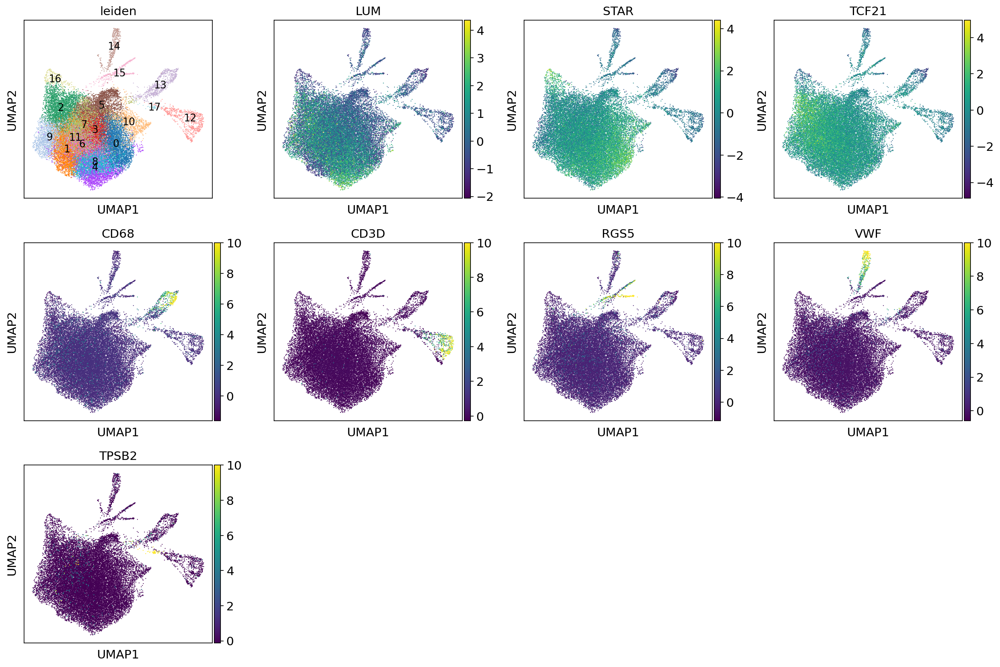

/home/liusong/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


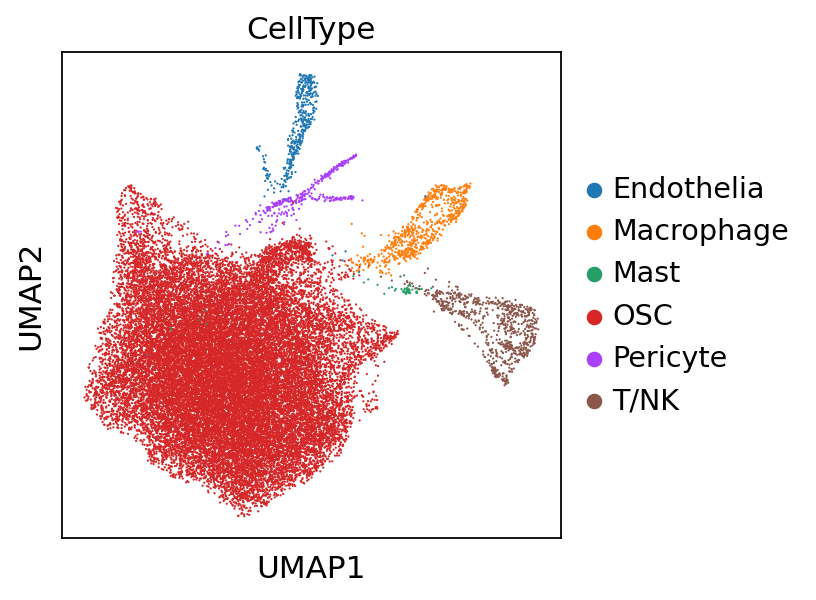

/home/liusong/.local/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()


In [34]:
#annotate the cell types for GSE260685 data
sc.pl.umap(OVCon,color=['leiden','LUM','STAR','TCF21','CD68','CD3D',"RGS5","VWF",'TPSB2'],legend_loc="on data",legend_fontsize='small',legend_fontweight='medium')
cellname=['OSC0','OSC1','OSC2','OSC3','OSC4','OSC5','OSC6','OSC7','OSC8','OSC9','OSC10','OSC11','T/NK12','Macrophage13','Endothelia14','Pericyte15','OSC16','Mast17']
OVCon.obs['myname']=OVCon.obs['leiden']
OVCon.rename_categories('myname', cellname)
OVCon.obs['CellType']=OVCon.obs.myname.str.strip('0123456789')
sc.pl.umap(OVCon,color=['CellType'])
OVCon.write("OVCon_SA_BBKNN.h5ad")

SAdata=OV_SA[OVCon.obs_names,:]
SAdata.obs['CellType']=OVCon.obs['CellType']
SAdata.obs['sampleID']=OVCon.obs['sampleID']
SAdata.obs['TestID']=SAdata.obs['sampleID']
SAdata.obs['Batch']="OV_SA"

/home/liusong/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/liusong/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)
/home/liusong/.local/lib/python3.7/site-packages/ipykernel_launcher.py:42: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


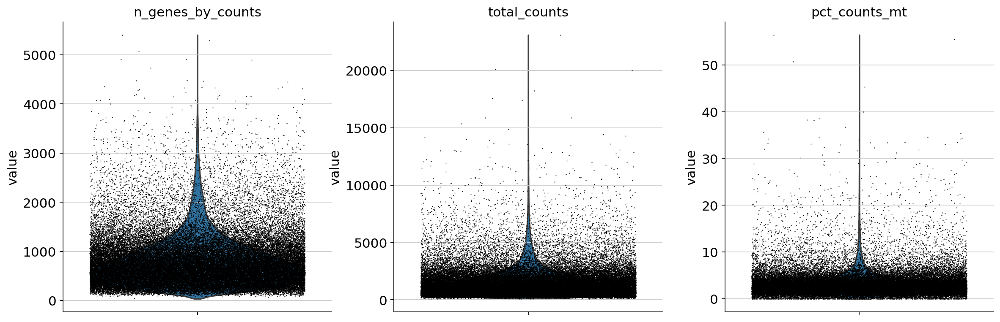

/home/liusong/.local/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/home/liusong/.local/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


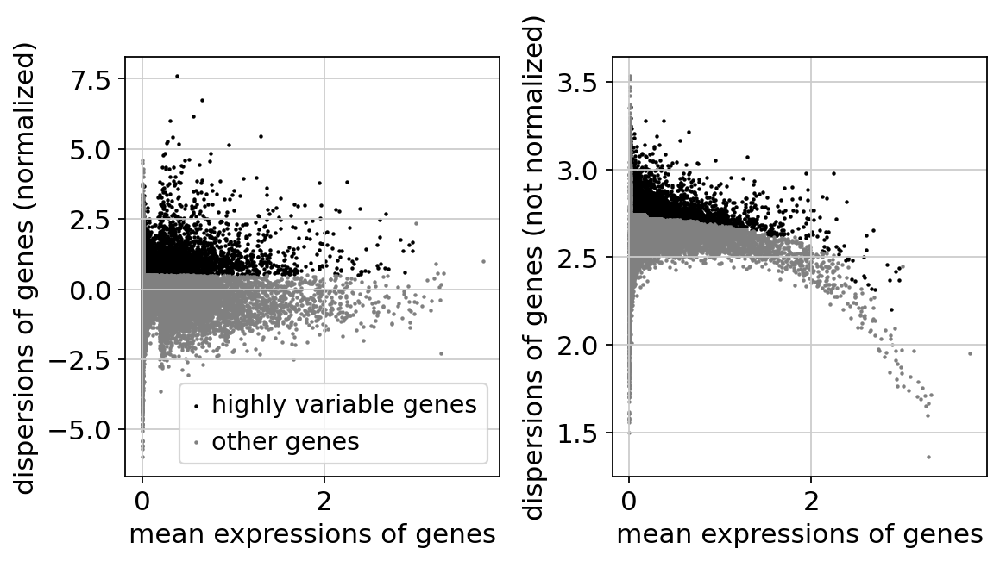

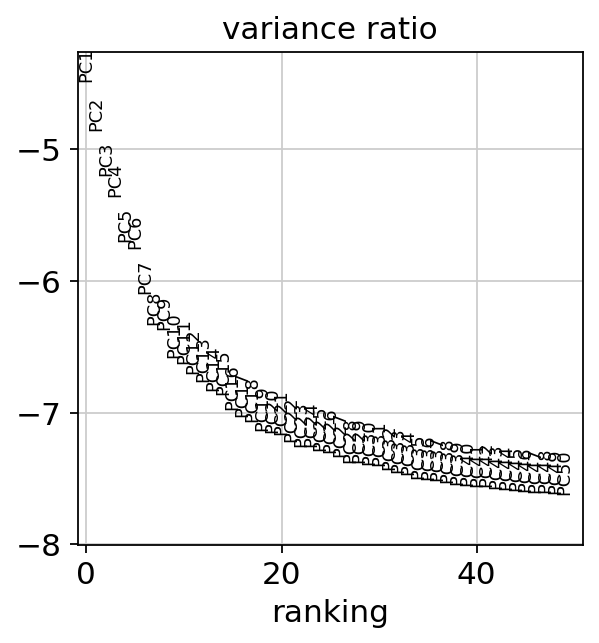

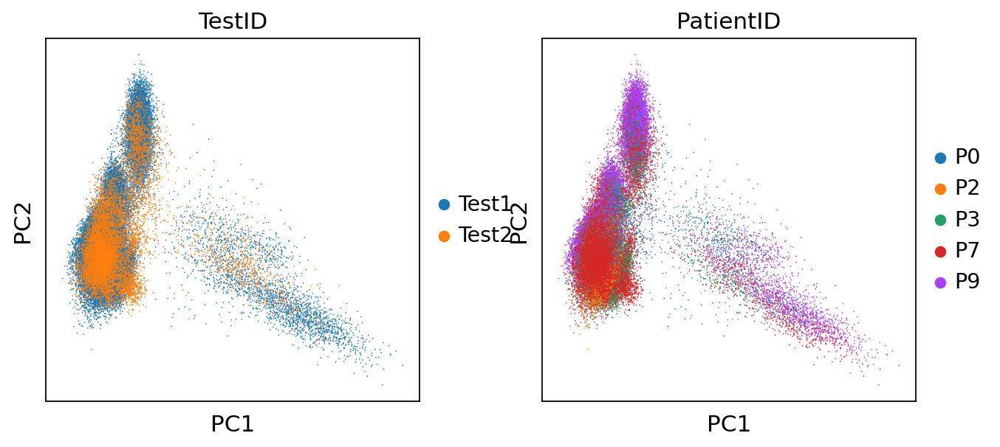

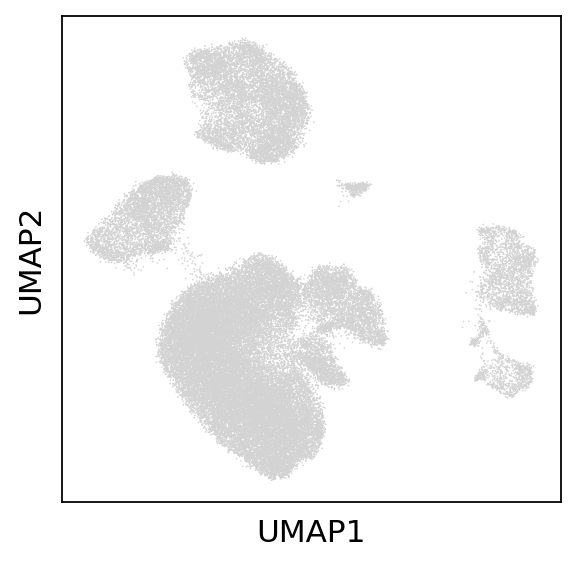

In [60]:
#NC_GSE118127 data reanalyze
NCfiles=os.listdir("/home/liusong/scRNA/endometriosis/V3data/Downloaded_Ovary_Control/NC_GSE118127/GSE118127_RAW/")
NCdata=sc.read_10x_h5("/home/liusong/scRNA/endometriosis/V3data/Downloaded_Ovary_Control/NC_GSE118127/GSE118127_RAW/"+NCfiles[0],genome=None,gex_only=True)
NCdata.var_names_make_unique()
NCfiles[0]
NCdata.obs.index=["sample_1-1_"+x for x in NCdata.obs.index]

for myfile in NCfiles[1:]:
        mydata=[];
        mydata = sc.read_10x_h5("/home/liusong/scRNA/endometriosis/V3data/Downloaded_Ovary_Control/NC_GSE118127/GSE118127_RAW/"+myfile,genome=None,gex_only=True);
        mydata.var_names_make_unique();
        myname = myfile[11:-32];
        myname = myname+"_";
        mydata.obs.index=[myname+x for x in mydata.obs.index];
        NCdata=[NCdata,mydata];
        NCdata=ad.concat(NCdata,merge="same")


NCdata
OV_NC=NCdata

NCdata.obs['sampleID']=NCdata.obs_names.str.rstrip('ATCG-1')
NCdata.obs['sampleID']=NCdata.obs['sampleID'].str.rstrip('_')
NCdata.obs
metainfo=pd.read_csv("/home/liusong/scRNA/endometriosis/V3data/Downloaded_Ovary_Control/NC_GSE118127/Meta_Info.csv")
metainfo.head(5)

dc=metainfo.set_index("Sample ID")["Patient"].to_dict()
aa=[]
for myID in list(NCdata.obs['sampleID']):
        aa.append(dc[myID])

NCdata.obs['PatientID']=aa
NCdata.obs['TestID']=NCdata.obs['sampleID'].isin(list(metainfo['Sample ID'][0:15])).astype("category")
myTest=['Test1','Test2']
NCdata.rename_categories('TestID',myTest)
NCdata.obs['Batch']="OV_NC"
NCdata.obs

ribosomes=NCdata.var_names.str.match("^RP[LS]")
NCdata=NCdata[:,~ribosomes]
NCdata.var['mt']=NCdata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(NCdata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(NCdata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],jitter=0.4, multi_panel=True)

NCdata = NCdata[NCdata.obs.pct_counts_mt < 10 , :]
sc.pp.filter_genes(NCdata,min_cells=10)
sc.pp.filter_cells(NCdata,min_genes=200)
NCdata = NCdata[NCdata.obs.n_genes_by_counts < 2500, :]
NCdata = NCdata[NCdata.obs.total_counts < 15000, :]
sc.pp.normalize_total(NCdata, target_sum=1e4)
sc.pp.log1p(NCdata)

sc.pp.normalize_total(NCdata, target_sum=1e4)
sc.pp.log1p(NCdata)

sc.pp.highly_variable_genes(NCdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(NCdata)
NCdata= NCdata[:, NCdata.var.highly_variable]
sc.pp.regress_out(NCdata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(NCdata, max_value=10)

sc.tl.pca(NCdata, svd_solver='arpack')
sc.pl.pca_variance_ratio(NCdata, log=True,n_pcs=50)
sc.pl.pca(NCdata,color=['TestID','PatientID'])

bbknn.bbknn(NCdata,batch_key='PatientID')
sc.tl.umap(NCdata)
sc.pl.umap(NCdata)
sc.tl.leiden(NCdata)
NCdata.write("OVCon_NC_BBKNN.h5ad")


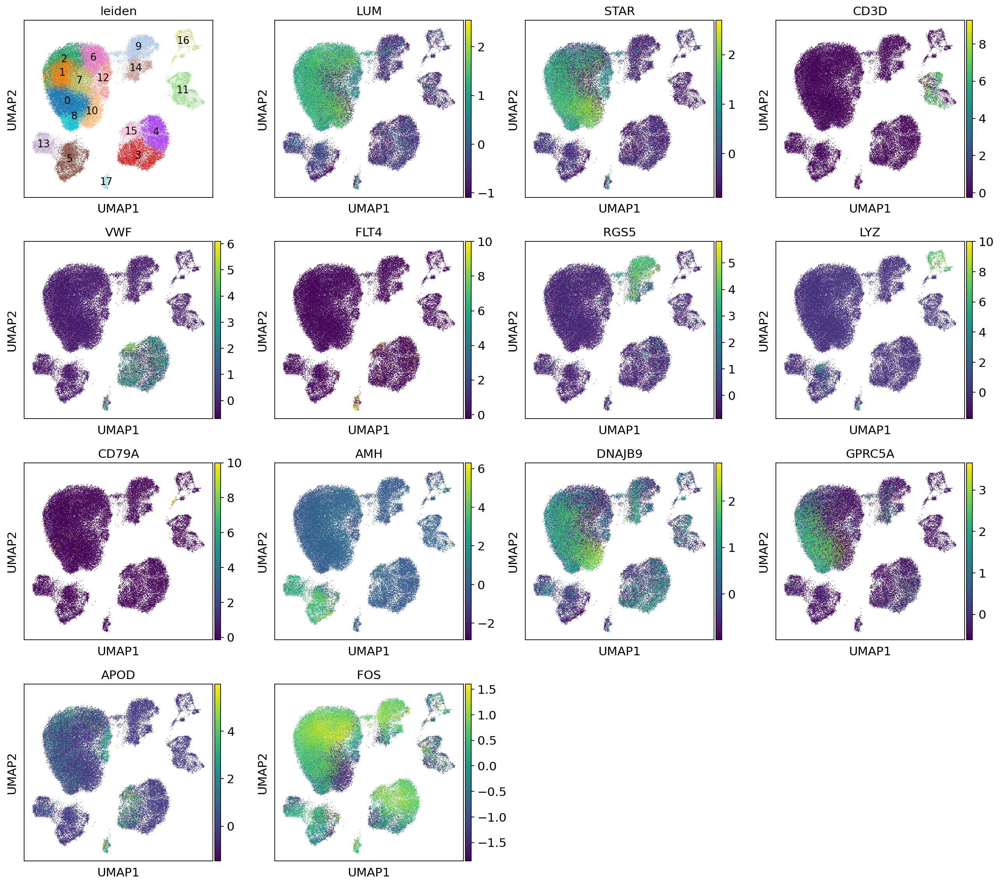

/home/liusong/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


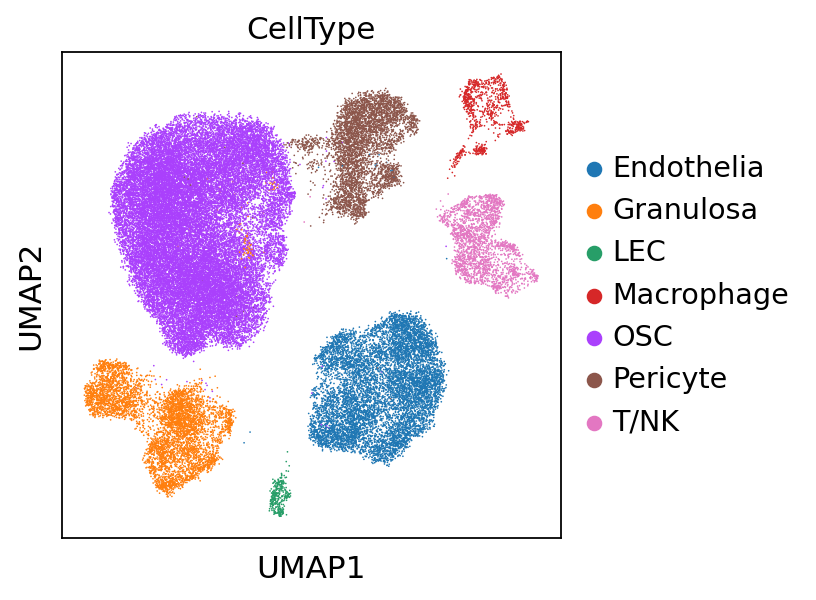

/home/liusong/.local/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()


In [51]:
#NC_GSE118127 cell annotation
sc.pl.umap(NCdata,color=['leiden','LUM','STAR','CD3D',"VWF",'FLT4','RGS5','LYZ','CD79A','AMH','DNAJB9','GPRC5A','APOD','FOS'],legend_loc="on data",legend_fontsize='small',legend_fontweight='medium')
cellname=['OSC0','OSC1','OSC2','Endothelia3','Endothelia4','Granulosa5','OSC6','OSC7','OSC8','Pericyte9','OSC10','T/NK11','OSC12','Granulosa13','Pericyte14','Endothelia15','Macrophage16','LEC17']
NCdata.obs['myname']=NCdata.obs['leiden']
NCdata.rename_categories('myname', cellname)
NCdata.obs['CellType']=NCdata.obs.myname.str.strip('0123456789')
sc.pl.umap(NCdata,color=['CellType'])
NCdata.write("OVCon_NC_BBKNN.h5ad")

NCdataraw=OV_NC[NCdata.obs_names,:]
NCdataraw.obs['CellType']=NCdata.obs['CellType']
NCdataraw.obs['sampleID']=NCdata.obs['sampleID']
NCdataraw.obs['TestID']=NCdataraw.obs['sampleID']
NCdataraw.obs['Batch']="OV_NC"

/home/liusong/.local/lib/python3.7/site-packages/ipykernel_launcher.py:6: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  


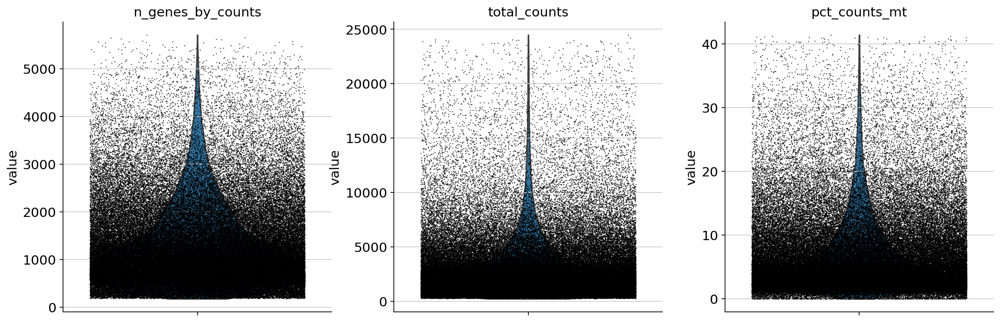

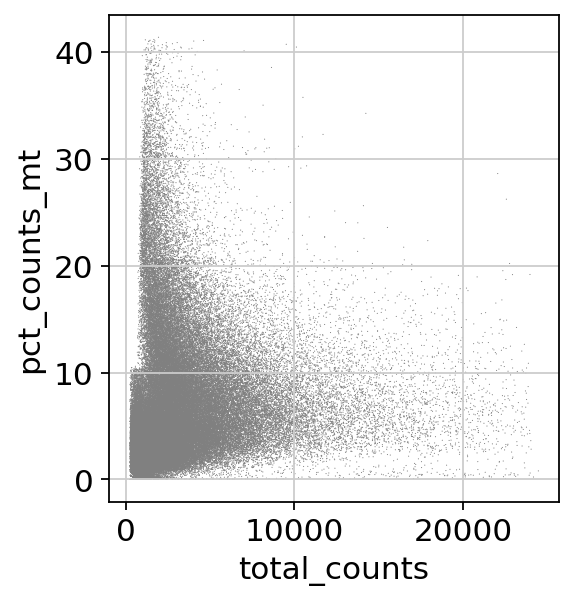

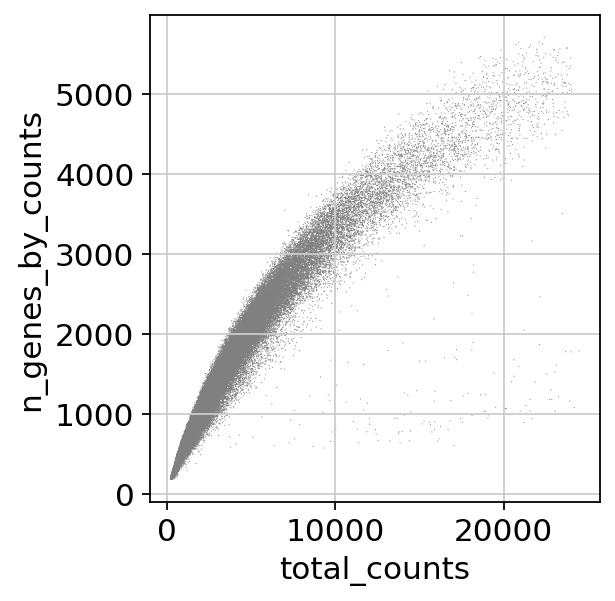

,CellType,sampleID,TestID,Batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
D1AAACCCAAGAGTACCG-1,OSC,D1,D1,OV_SA,1080,1846.0,160.0,8.667389
D1AAACCCACAAACTCGT-1,OSC,D1,D1,OV_SA,2204,4959.0,479.0,9.659205
D1AAACCCACAACCACAT-1,OSC,D1,D1,OV_SA,834,1791.0,438.0,24.455612
D1AAACCCAGTCACAATC-1,OSC,D1,D1,OV_SA,1231,2658.0,370.0,13.920240
D1AAACCCAGTCGGCCTA-1,OSC,D1,D1,OV_SA,1840,3814.0,257.0,6.738333
...,...,...,...,...,...,...,...,...
TTTGTTGCACCGCTGA-21,LEC,21,21,ourOEM,3335,8305.0,509.0,6.128838
TTTGTTGCAGAATGTA-21,T/NK,21,21,ourOEM,2847,7562.0,592.0,7.828617
TTTGTTGCAGCGCTTG-21,OSCa,21,21,ourOEM,2189,5202.0,187.0,3.594771
TTTGTTGGTTACACAC-21,T/NK,21,21,ourOEM,4104,16058.0,1889.0,11.763607


In [52]:
adata=[SAdata,NCdataraw,ourOEM]
adata=ad.concat(adata,merge="same")

ribosomes=adata.var_names.str.match("^RP[LS]")
adata=adata[:,~ribosomes]
adata.var['mt']=adata.var_names.str.startswith('MT-')
adata
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

adata.write("Intergated_OEM_OVCon_normalized.h5ad")
adata.obs

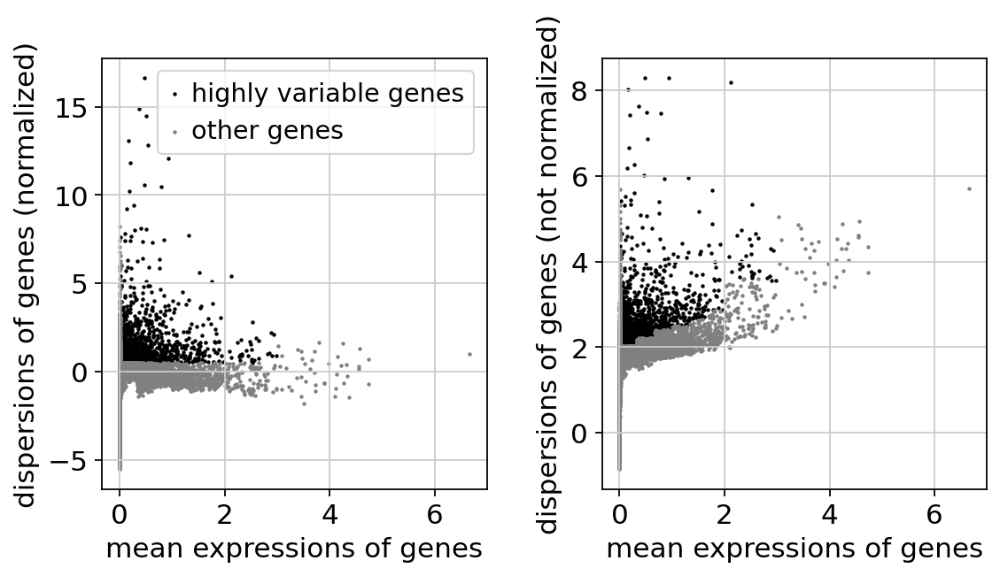

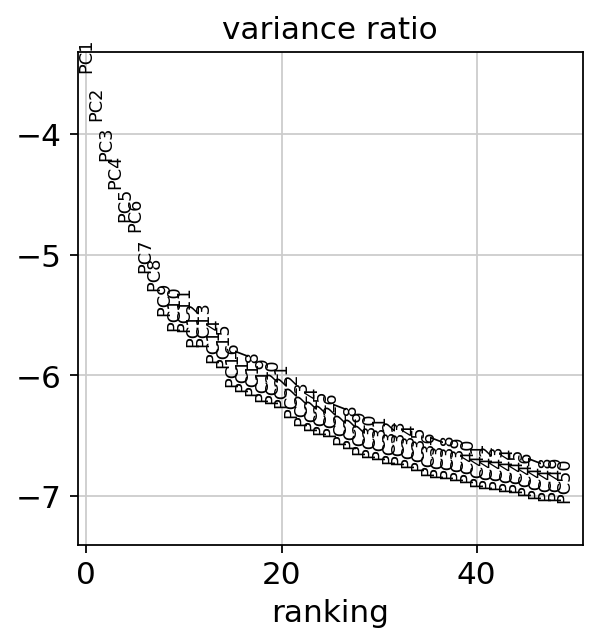

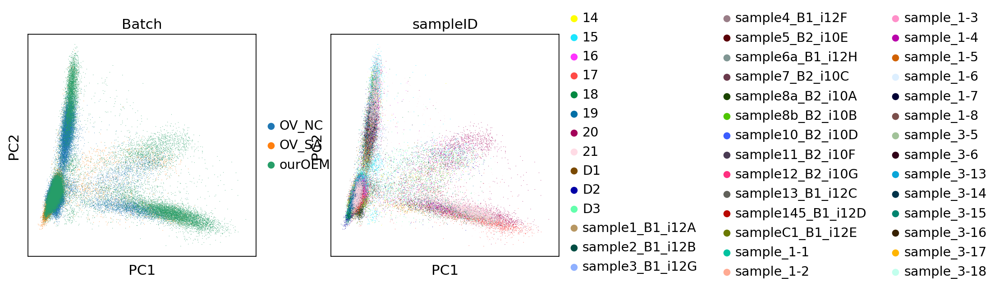

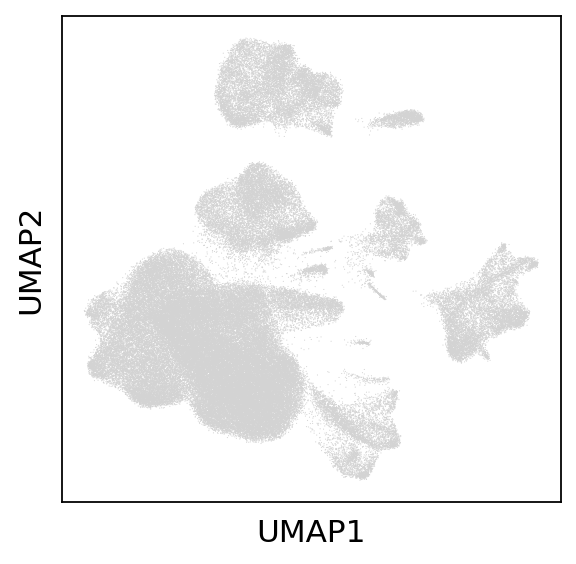

AnnData object with n_obs × n_vars = 121159 × 2314
    obs: 'CellType', 'sampleID', 'TestID', 'Batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'Batch_colors', 'sampleID_colors', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [53]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata,save="adata_High_variable_genes.png")
adata.raw = adata

adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)

sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True,n_pcs=50,save="adata_PCA_variance.png")
sc.pl.pca(adata,color=['Batch','sampleID'])

bbknn.bbknn(adata,batch_key='TestID')
sc.tl.umap(adata)
sc.pl.umap(adata)
sc.tl.leiden(adata)
adata


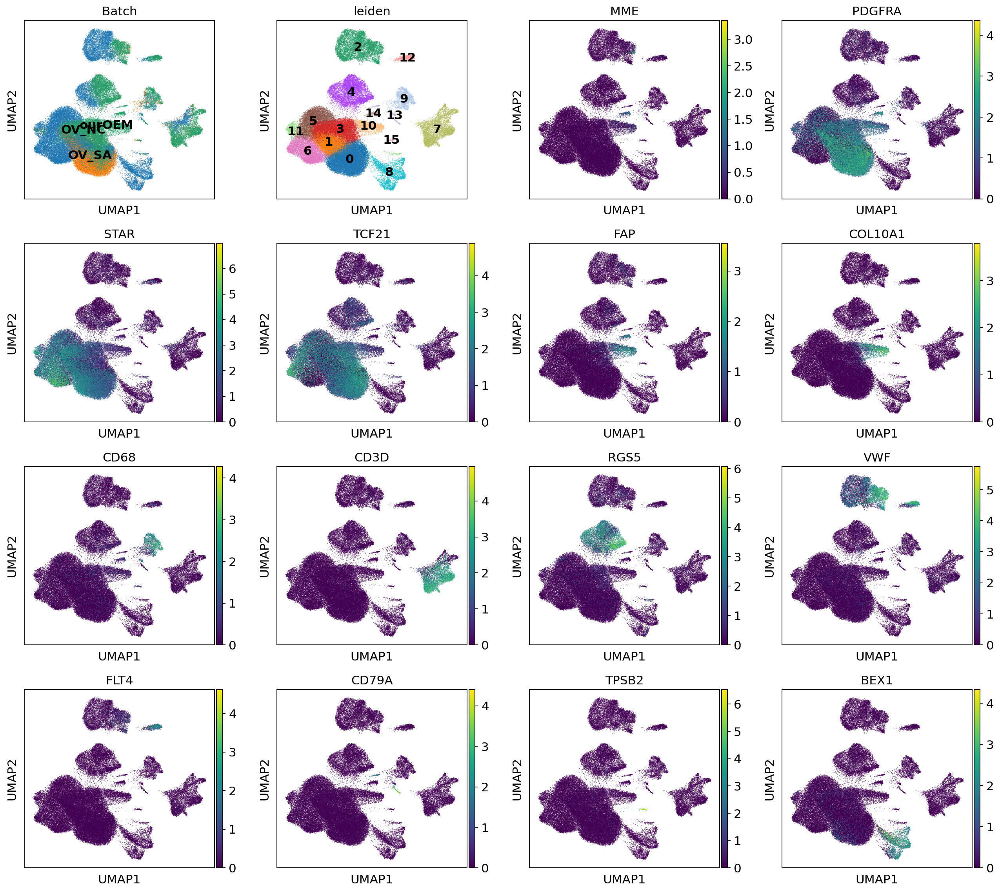

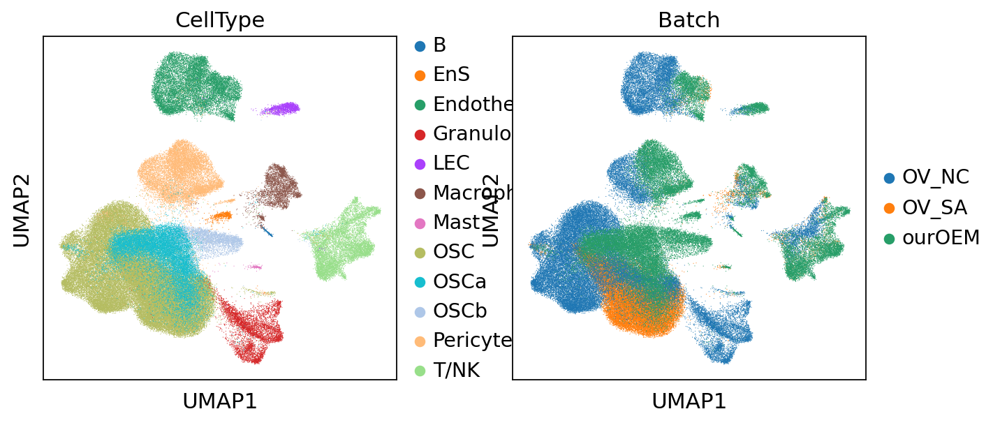

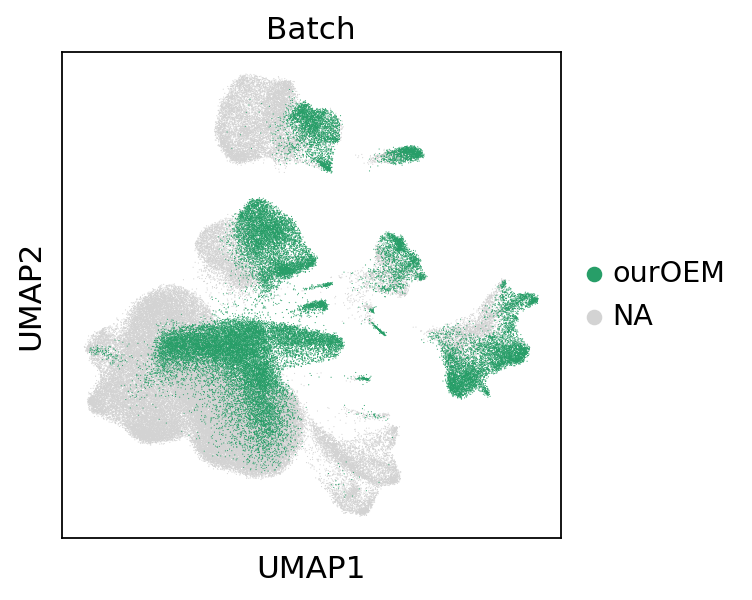

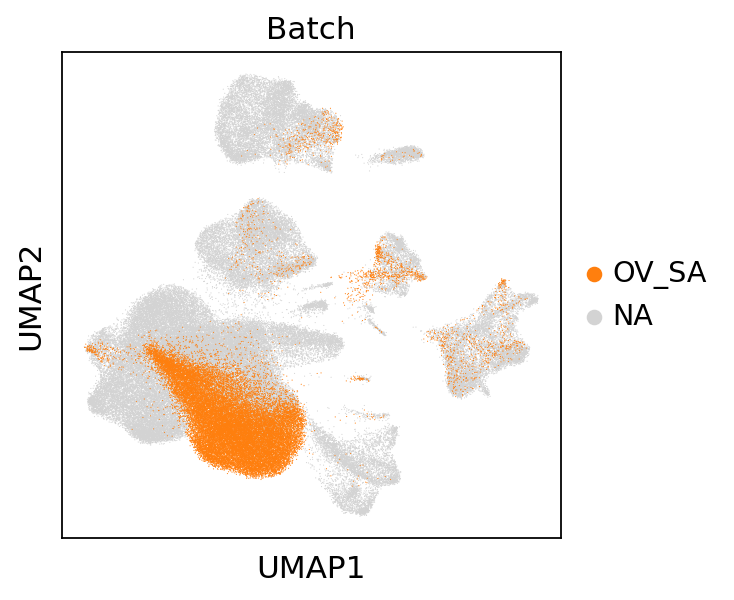

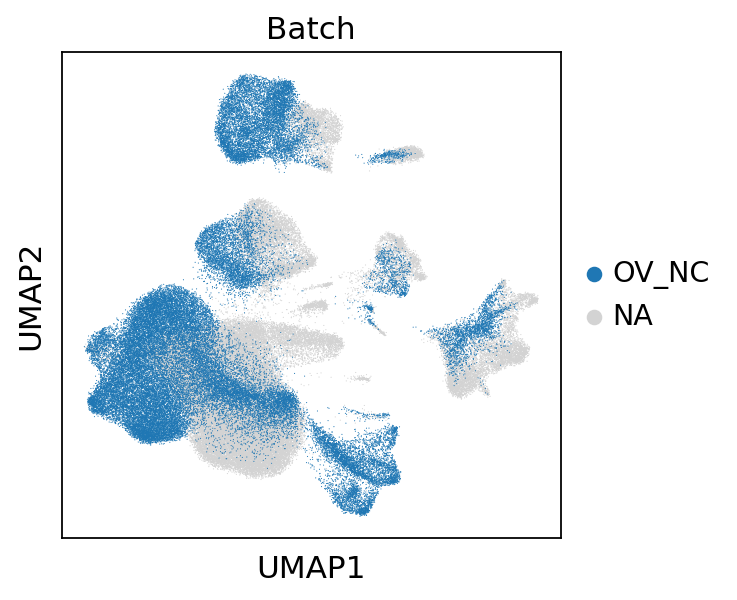

In [56]:
sc.pl.umap(adata,color=['Batch','leiden','MME','PDGFRA','STAR','TCF21','FAP','COL10A1','CD68','CD3D',"RGS5","VWF",'FLT4','CD79A','TPSB2','BEX1'],legend_loc="on data")
sc.pl.umap(adata,color=['CellType','Batch'])
for mygroup in ['ourOEM','OV_SA','OV_NC']:
    sc.pl.umap(adata,color=['Batch'],groups=mygroup)

adata.write("Intergated_OEM_OVCon_leiden_BBKNN.h5ad")